In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib
import time
from torchvision import transforms
from PIL import Image

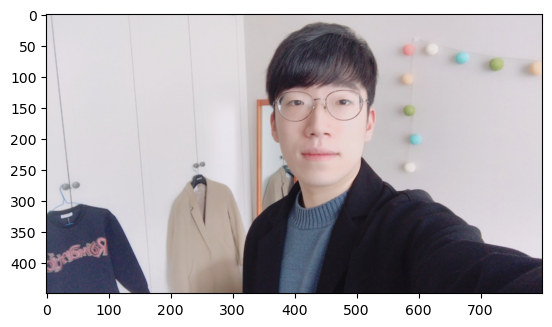

In [2]:
home_dir = os.getenv("HOME")
image_path = os.path.join(home_dir, 'work/camera_sticker/images/image.png')
img_bgr = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [3]:
detector_hog = dlib.get_frontal_face_detector()
dlib_rects = detector_hog(img_rgb, 1) # (image, num of image pyramid)
model_path = os.path.join(home_dir, 'work/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
landmark_predictor = dlib.shape_predictor(model_path)

list_landmarks=[]

for dlib_rect in dlib_rects:
    # 모든 landmark의 위치정보를 points 변수에 저장
    points = landmark_predictor(img_rgb, dlib_rect)
    # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


In [4]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print(landmark[30])
    x = landmark[30][0]
    y = landmark[30][1]
    w = h= dlib_rect.width()
    
print(f'(x,y) : ({x},{y})')
print(f'(w,h) : ({w},{h})')

(437, 182)
(x,y) : (437,182)
(w,h) : (187,187)


In [5]:
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)
img_sticker = cv2.resize(img_sticker, (w,h))

In [6]:
#x, y 위치 조정. 사진 상하 좌우로 나가는 경우 고려
refined_x = x -(w-7)//2
refined_y = y-int(h/2-7)

if refined_x < 0:
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0

if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]
    refined_y = 0

print(f'(x, y) : ({refined_x}, {refined_y})')

(x, y) : (347, 96)


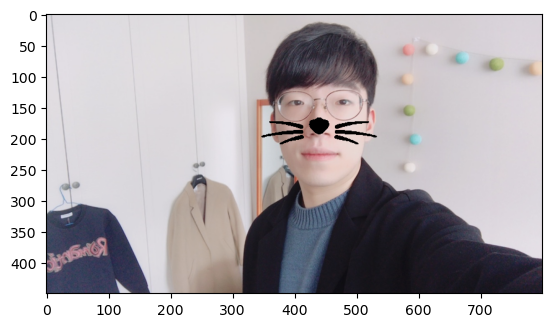

In [7]:
sticker_area = img_bgr.copy()[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
result = img_bgr.copy()
result[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = np.where(img_sticker==0, img_sticker, sticker_area).astype(np.uint8)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)) # rgb만 적용해놓은 원본 이미지에 고양이 수염이 나오게 됨
plt.show()

In [8]:
# 함수로 통합하기
def CatFilter(img, sticker, isReverse=False, x_correction=7, y_correction=7,alpha = 1, img_show=True):
    img_bgr = img.copy()
    img_rgb = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_BGR2RGB)
    detector_hog = dlib.get_frontal_face_detector()
    dlib_rects = detector_hog(img_rgb, 1) # (image, num of image pyramid)
    model_path = os.path.join(home_dir, 'work/camera_sticker/models/shape_predictor_68_face_landmarks.dat')
    landmark_predictor = dlib.shape_predictor(model_path)

    w = h = x = y = None

    list_landmarks=[]
    
    for dlib_rect in dlib_rects:
        # 모든 landmark의 위치정보를 points 변수에 저장
        points = landmark_predictor(img_rgb, dlib_rect)
        # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
        list_points = list(map(lambda p: (p.x, p.y), points.parts()))
        list_landmarks.append(list_points)
        
    for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
        x = landmark[30][0]
        y = landmark[30][1]
        w = h= dlib_rect.width()
    try:
        img_sticker = cv2.resize(sticker.copy(), (w,h))
    except:
        print("Face is not detected")
        print(x,y,w,h)
        if img_show:
            plt.imshow(img_rgb) # rgb만 적용해놓은 원본 이미지에 고양이 수염이 나오게 됨
            plt.show()
        return img_rgb
        
    refined_x = x -(w-x_correction)//2
    refined_y = y-int(h/2-y_correction)
    
    if refined_x < 0:
        img_sticker = img_sticker[:, -refined_x:]
        refined_x = 0
    
    if refined_y < 0:
        img_sticker = img_sticker[-refined_y:, :]
        refined_y = 0

    sticker_area = img_bgr.copy()[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
    result = img_bgr.copy()
    if isReverse:
        result[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = np.where(img_sticker==0, sticker_area, img_sticker).astype(np.uint8)
    else:
        result[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = np.where(img_sticker==0, img_sticker, sticker_area).astype(np.uint8)

    result = cv2.addWeighted(img_rgb.copy(), 1-alpha, cv2.cvtColor(result, cv2.COLOR_BGR2RGB), alpha,0)
    if img_show:
        plt.imshow(result) # rgb만 적용해놓은 원본 이미지에 고양이 수염이 나오게 됨
        plt.show()
        
    return result

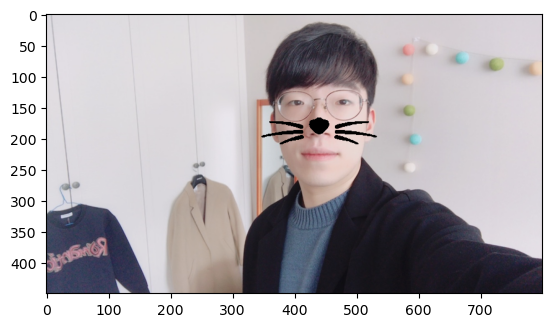

In [9]:
# 함수로도 잘 되는지 확인하기
image_path = os.path.join(home_dir, 'work/camera_sticker/images/image.png')
img_bgr = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr, img_sticker)

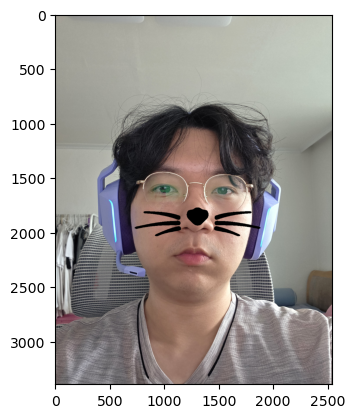

In [10]:
#내 사진으로도 확인
image_path = os.path.join(home_dir, 'work/self.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

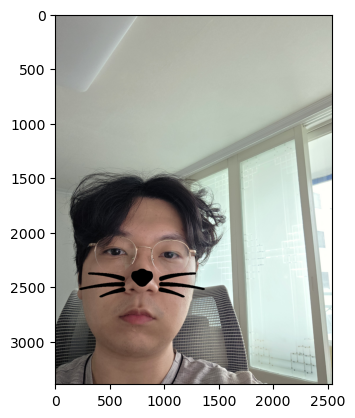

In [11]:
#빛이 들어오는 각도에 따라 달라지는지 확인
image_path = os.path.join(home_dir, 'work/self2.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

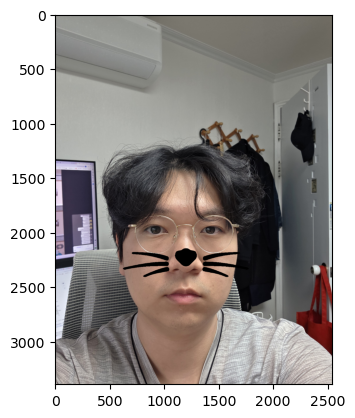

In [12]:
#마찬가지로 환경에 따라 달라지는지 확인
home_dir = os.getenv("HOME")
# work/camera_sticker/images/image.png
image_path = os.path.join(home_dir, 'work/self3.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

Face is not detected
None None None None


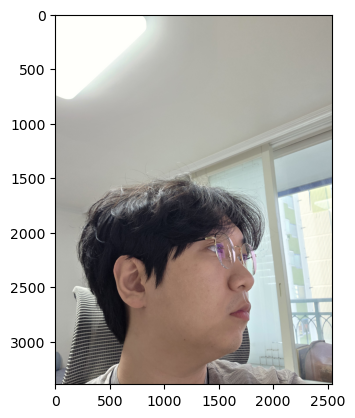

In [13]:
#얼굴을 오른쪽으로 돌렸을 때는 감지 못함
home_dir = os.getenv("HOME")
# work/camera_sticker/images/image.png
image_path = os.path.join(home_dir, 'work/self4.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

Face is not detected
None None None None


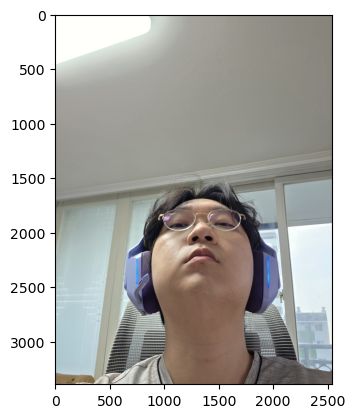

In [14]:
# 얼굴을 위로 들었을때는 감지 못함
home_dir = os.getenv("HOME")
# work/camera_sticker/images/image.png
image_path = os.path.join(home_dir, 'work/self5.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

In [15]:
#편리한 이미지 변환을 위해 변환 함수 선언
def ImageConvert(image, isP2C=False):
    if isP2C:
        img_array = np.array(image)
        cv = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)
        return cv

    else:
        cvt_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        PIL_img = Image.fromarray(cvt_img)
        return PIL_img
        
#cv 이미지로 transform을 받을 수 있게하는 함수 선언
def CVTransform(img, transform):
    PIL_img = ImageConvert(img)
    transformed_img = transform(PIL_img)
    cv_img = ImageConvert(transformed_img, isP2C=True)
    return cv_img

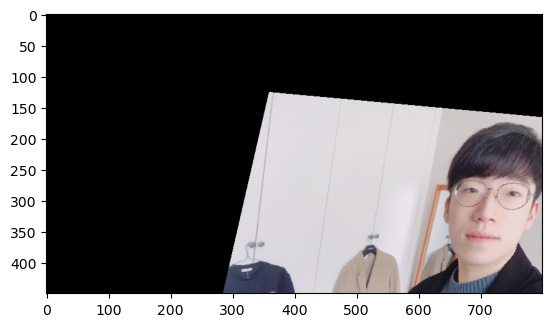

In [16]:
# CVTransform 함수가 이미지를 원하는대로 변형 시키는지 확인하기 (affine)

transform_Rotation = transforms.Compose(
    [
        transforms.RandomRotation(degrees=(50,60),expand=False, center=None)
    ]
)

transform_Affine = transforms.Compose(
    [
        transforms.RandomAffine(degrees=60, translate=(0.4, 0.4),
                               scale=(0.6, 1.4), shear=15)
    ]
)

transformed_img = cv2.cvtColor(CVTransform(img_bgr, transform_Affine), cv2.COLOR_BGR2RGB)
plt.imshow(transformed_img)
plt.show()

Face is not detected
None None None None


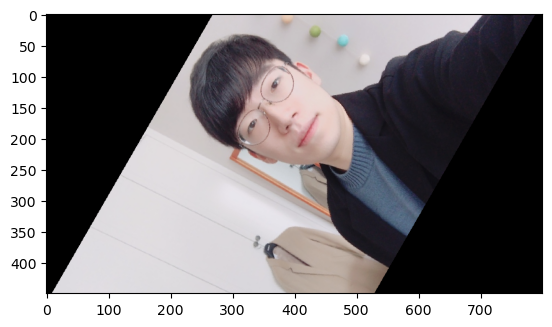

In [17]:
#회전했을 때 이상하게 감지되거나 감지되지 않는 것을 확인
transformed_img = CVTransform(img_bgr, transform_Rotation)
image = CatFilter(transformed_img, img_sticker)

Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None


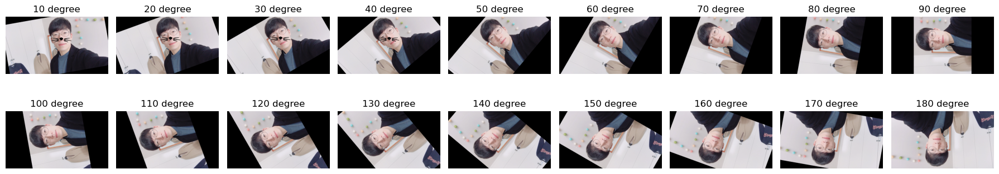

In [18]:
# 10도 간격으로 회전에 따른 감지 변화를 확인해 보니 50-60도 이상이면 감지 못함
image_list = []
for i in range(18):
    transform_Rotation = transforms.Compose(
        [
            transforms.RandomRotation(degrees=(10*(i+1),10*(i+1)),expand=False, center=None)
        ]
    )
    transformed_img = CVTransform(img_bgr, transform_Rotation)
    image_list.append(CatFilter(transformed_img, img_sticker, img_show=False))

titles = ["10 degree","20 degree","30 degree",
          "40 degree","50 degree","60 degree",
          "70 degree","80 degree","90 degree",
          "100 degree","110 degree","120 degree",
          "130 degree","140 degree","150 degree"
         ,"160 degree","170 degree","180 degree"]

fig, axs = plt.subplots(2,9, figsize=(18, 4))
for i, ax in enumerate(axs.flat):
    ax.imshow(image_list[i])
    ax.set_title(titles[i])
    ax.axis('off')

plt.tight_layout()
plt.show()
# 60도 부터 감지를 하지 못함

Face is not detected
None None None None


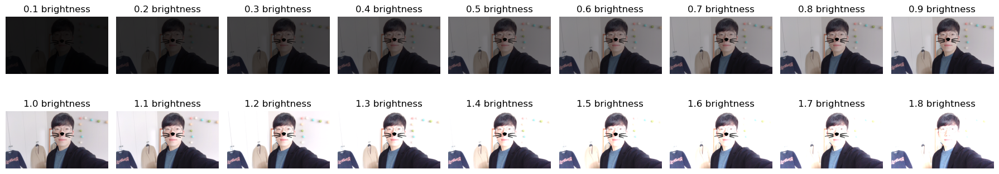

In [19]:
# 밝기의 영향도 확인해 봤지만 밝기는 크게 관계가 없어보임. 구별을 못할정도의 수준인 1.8이상이거나 0.1이하면 감지하지 못함.
image_list = []
for i in range(18):
    transform_ColorJitter = transforms.Compose(
        [
            transforms.ColorJitter(
                brightness=(0.1*(i+1),0.1*(i+1)), contrast = (1,1),
                saturation = (1,1), hue = (0.0,0.0)
            )
        ]
    )
    transformed_img = CVTransform(img_bgr, transform_ColorJitter)
    image_list.append(CatFilter(transformed_img, img_sticker, img_show=False))

titles = ["0.1 brightness","0.2 brightness","0.3 brightness",
          "0.4 brightness","0.5 brightness","0.6 brightness",
          "0.7 brightness","0.8 brightness","0.9 brightness",
          "1.0 brightness","1.1 brightness","1.2 brightness",
          "1.3 brightness","1.4 brightness","1.5 brightness"
         ,"1.6 brightness","1.7 brightness","1.8 brightness"]

fig, axs = plt.subplots(2,9, figsize=(18, 4))
for i, ax in enumerate(axs.flat):
    ax.imshow(image_list[i])
    ax.set_title(titles[i])
    ax.axis('off')

plt.tight_layout()
plt.show()

Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None
Face is not detected
None None None None


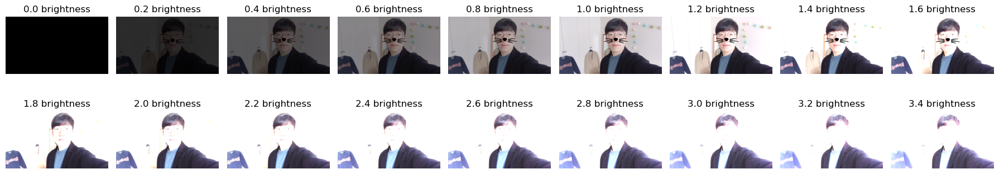

In [20]:
# 확실히 확인하기 위하여 0.2 간격으로 출력해봄. 여전히 1.8이상은 감지 못함
image_list = []
for i in range(18):
    transform_ColorJitter = transforms.Compose(
        [
            transforms.ColorJitter(
                brightness=(0.2*i,0.2*i), contrast = (1,1),
                saturation = (1,1), hue = (0.0,0.0)
            )
        ]
    )
    transformed_img = CVTransform(img_bgr, transform_ColorJitter)
    image_list.append(CatFilter(transformed_img, img_sticker, img_show=False))

titles = ["0.0 brightness","0.2 brightness","0.4 brightness",
          "0.6 brightness","0.8 brightness","1.0 brightness",
          "1.2 brightness","1.4 brightness","1.6 brightness",
          "1.8 brightness","2.0 brightness","2.2 brightness",
          "2.4 brightness","2.6 brightness","2.8 brightness"
         ,"3.0 brightness","3.2 brightness","3.4 brightness"]

fig, axs = plt.subplots(2,9, figsize=(18, 4))
for i, ax in enumerate(axs.flat):
    ax.imshow(image_list[i])
    ax.set_title(titles[i])
    ax.axis('off')

plt.tight_layout()
plt.show()

Face is not detected
None None None None


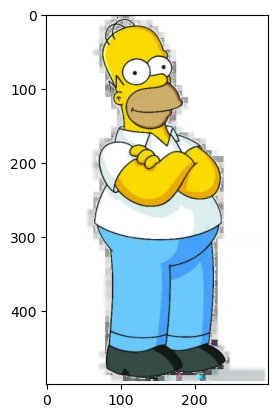

runtime: 2.4160


In [21]:
# 실행 시간 재가 + 여러 스타일 시도
# 카툰 스타일
start_time = time.time()

image_path = os.path.join(home_dir, 'work/Homer_Simpson.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


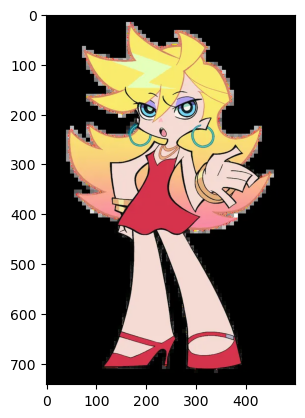

runtime: 2.8395


In [22]:
# 카툰 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Panty_Anarchy.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


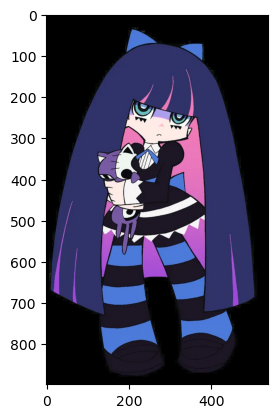

runtime: 3.0656


In [23]:
# 카툰 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Stocking_Anarchy.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


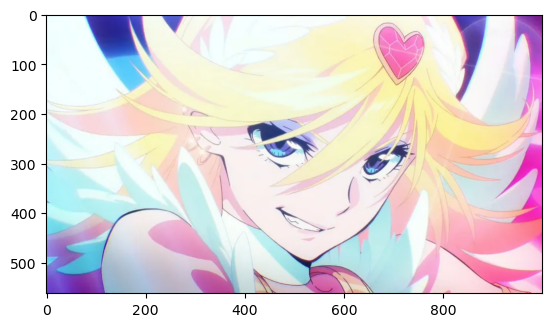

runtime: 3.0306


In [24]:
# 일본 애니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Panty_Anarchy_moe.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


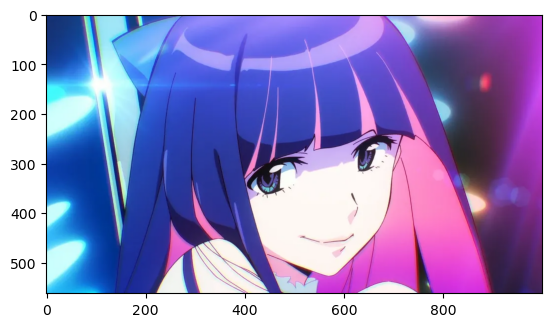

runtime: 2.9439


In [25]:
# 일본 애니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Stocking_Anarchy_moe.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


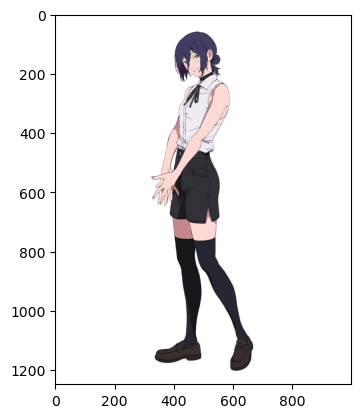

runtime: 3.3106


In [26]:
# 일본 에니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Reze.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


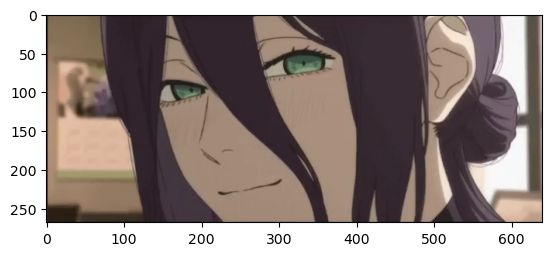

runtime: 2.4604


In [27]:
# 일본 에니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Reze2.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


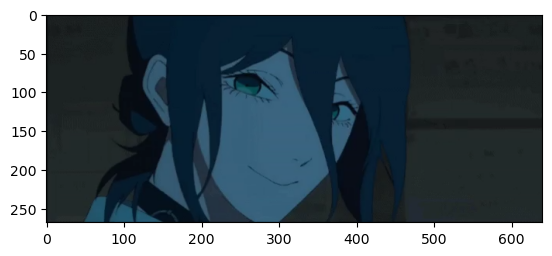

runtime: 2.5318


In [28]:
# 일본 에니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Reze3.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


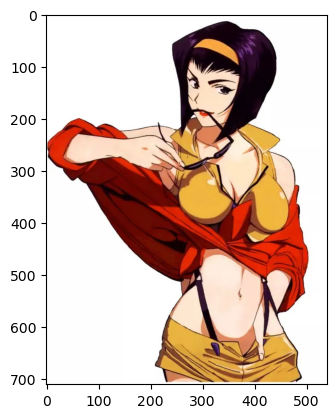

runtime: 2.7133


In [29]:
# 일본 에니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Faye_Valentine.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


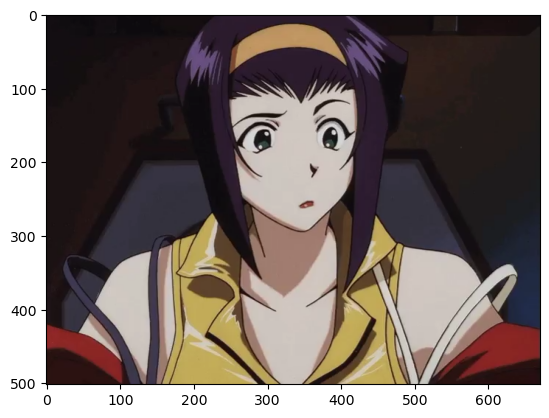

runtime: 2.5697


In [30]:
# 일본 에니매이션 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Faye_Valentine2.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


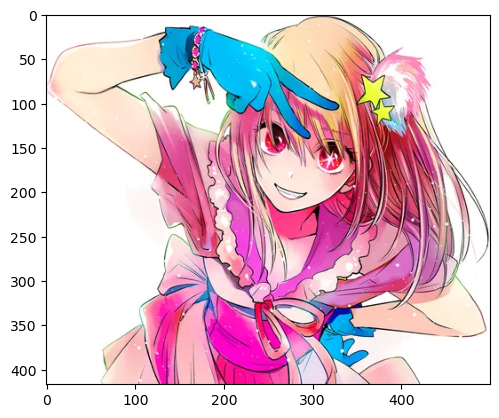

runtime: 2.8016


In [31]:
# 일본 만화 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Ruby_Hoshino.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


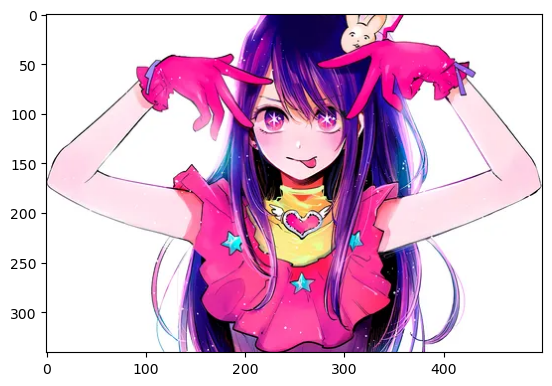

runtime: 2.4624


In [32]:
# 일본 만화 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Ai_Hoshino.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


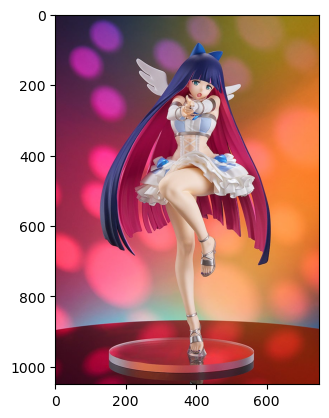

runtime: 2.8949


In [33]:
# 일본 피규어 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Stocking_Anarchy_figure.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


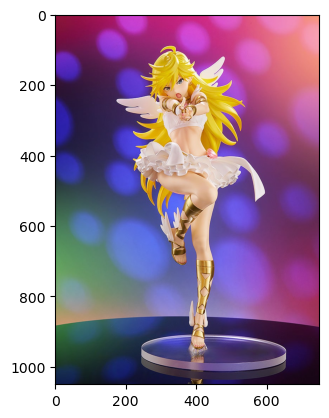

runtime: 3.0270


In [34]:
# 일본 피규어 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Panty_Anarchy_figure.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


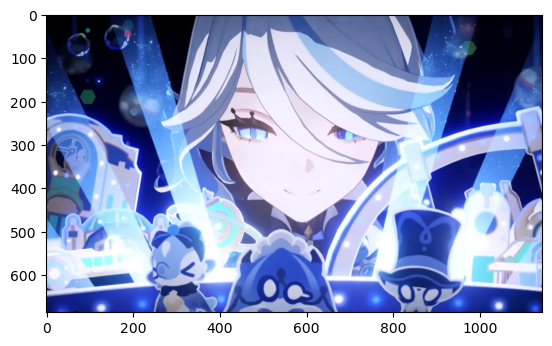

runtime: 2.8240


In [35]:
# 서브 컬쳐 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Furina1.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


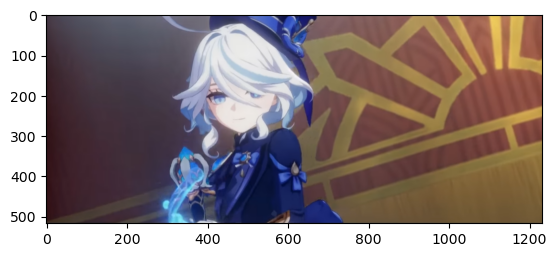

runtime: 3.0695


In [36]:
# 서브 컬쳐 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Furina2.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


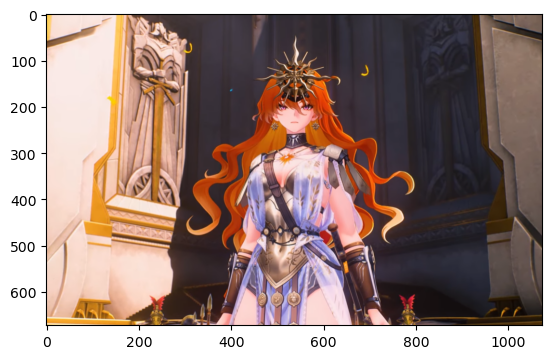

runtime: 3.0165


In [37]:
# 서브 컬쳐 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Augusta1.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


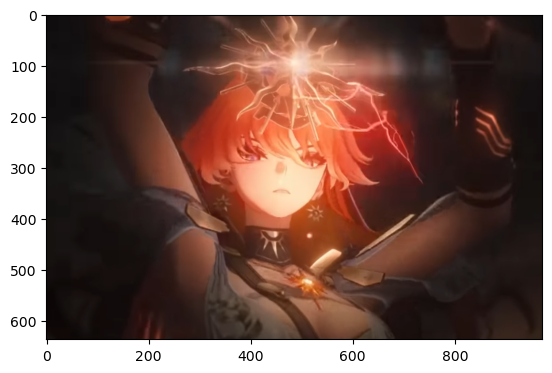

runtime: 2.9446


In [38]:
# 서브 컬쳐 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Augusta2.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


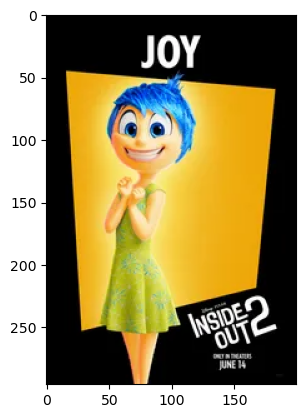

runtime: 2.3342


In [39]:
# 미국 3D 에니매이션 영화 (PIXAR) 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/joy.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

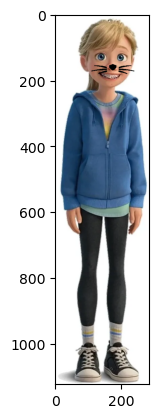

runtime: 2.5085


In [40]:
# 미국 3D 에니매이션 영화 (PIXAR) 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Riley_Andersen.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


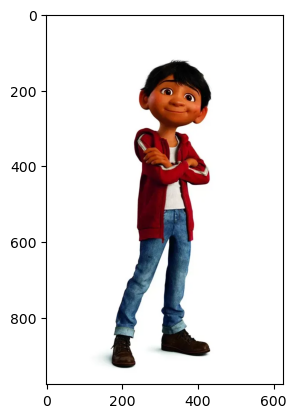

runtime: 3.0668


In [41]:
# 미국 3D 에니매이션 영화 (PIXAR) 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Miguel_Rivera.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


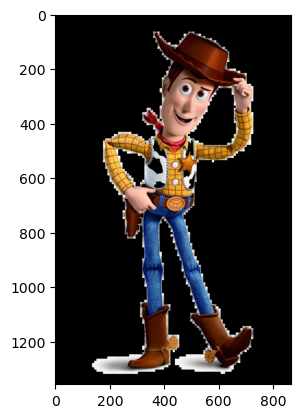

runtime: 3.5907


In [42]:
# 미국 3D 에니매이션 영화 (PIXAR) 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Woody.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

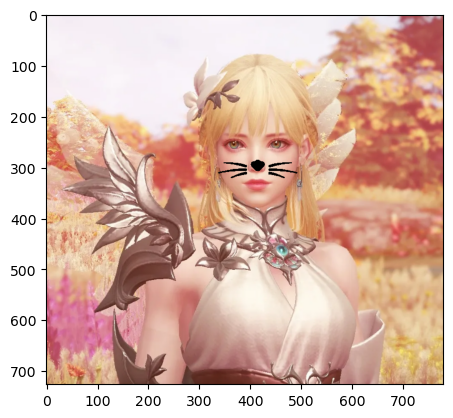

runtime: 2.9824


In [43]:
# 한국 3D 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Ninave.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

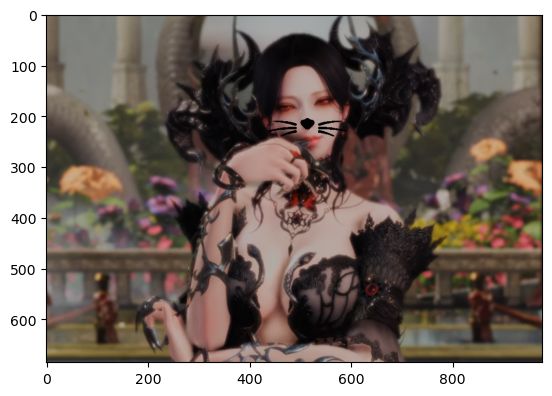

runtime: 2.9317


In [44]:
# 한국 3D 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Echidna.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

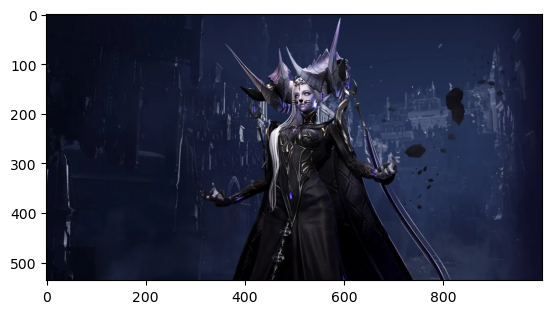

runtime: 3.1010


In [45]:
# 한국 3D 게임 스타일

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Abrelshud.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

Face is not detected
None None None None


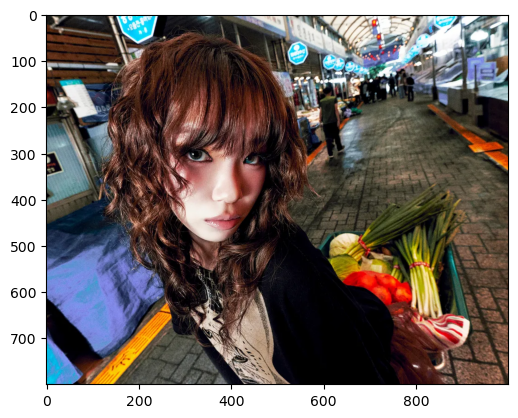

runtime: 3.3441


In [46]:
# 실사 스타일 (한국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Chaewon.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

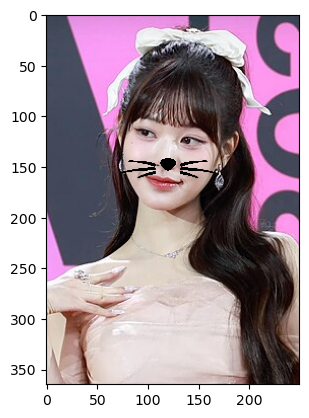

runtime: 2.2541


In [47]:
# 실사 스타일 (한국 연예인)

import time

start_time = time.time()

image_path = os.path.join(home_dir, 'work/IVE_Wonyoung.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

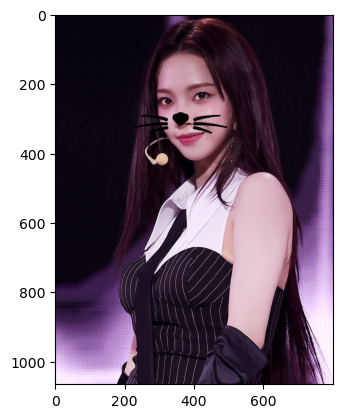

runtime: 3.0797


In [48]:
# 실사 스타일 (한국 연예인)

start_time = time.time()

home_dir = os.getenv("HOME")
# work/camera_sticker/images/image.png
image_path = os.path.join(home_dir, 'work/Karina.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

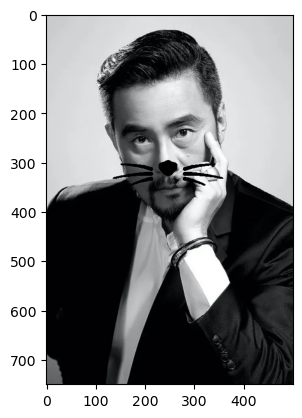

runtime: 2.7968


In [49]:
# 실사 스타일 (한국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Choi_Min_Soo.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

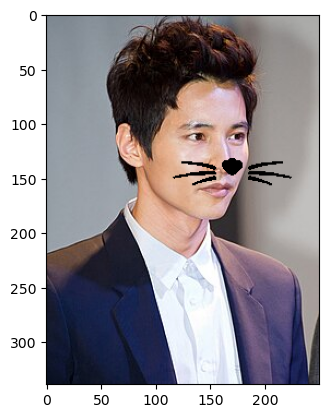

runtime: 2.3985


In [50]:
# 실사 스타일 (한국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Won_Bin.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

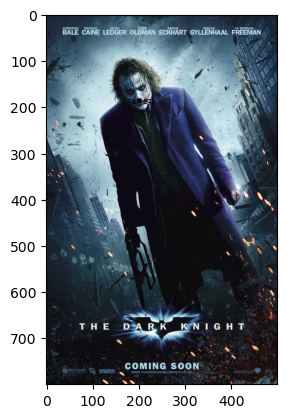

runtime: 2.6050


In [51]:
# 실사 스타일 (외국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Joker.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

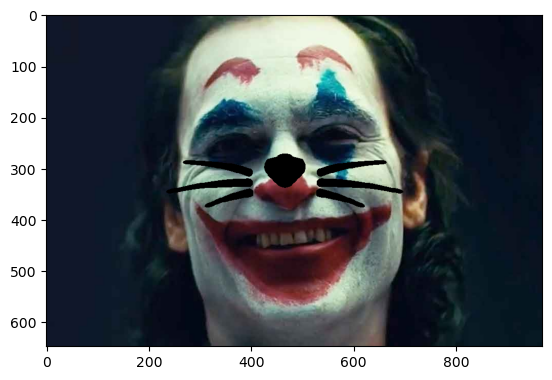

runtime: 3.0527


In [52]:
# 실사 스타일 (외국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Joker2.jpg')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

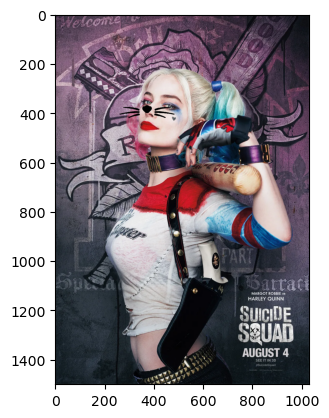

runtime: 3.9373


In [53]:
# 실사 스타일 (외국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Margot_Elise_Robbie.webp')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

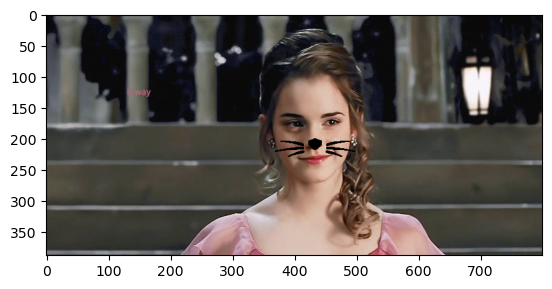

runtime: 2.7684


In [54]:
# 실사 스타일 (외국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Emma_Charlotte_Duerre_Watson.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

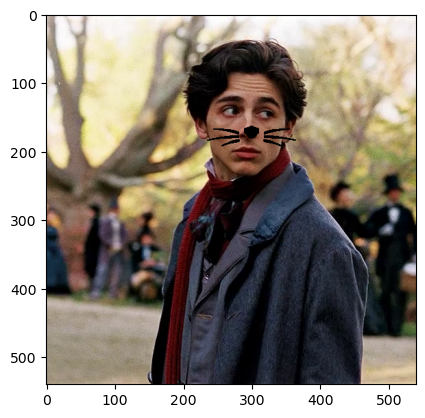

runtime: 2.8369


In [55]:
# 실사 스타일 (외국 연예인)

start_time = time.time()

image_path = os.path.join(home_dir, 'work/Timothée_Chalamet.png')
img_bgr_cel = cv2.imread(image_path)
sticker_path = os.path.join(home_dir, 'work/cat-whiskers.png')
img_sticker = cv2.imread(sticker_path)

image = CatFilter(img_bgr_cel, img_sticker)

end_time = time.time()

print(f"runtime: {end_time-start_time:.4f}")

# **기본 기능 구현**

기본적인 카메라 앱 기능을 함수로 구현하여 여러 이미지에 대응할 수 있게 하였고, 얼굴을 검출하여 스티커 사진을 합성하는대 성공하였습니다.

이미지의 각도와 밝기, 얼굴의 회전 등에 따라서 어떤 영향을 받는지 확인하였으며 실험 결과는 다음과 같습니다.

- ### **각도에 따른 변화**

각도에 따른 변화는 실제로 얼굴을 돌렸을 때와 이미지를 회전했을 때로 나누어 확인하였습니다. 정면을 응시했을 때는 잘 되는것을 확인할 수 있었습니다.

하지만, 얼굴을 돌려 한쪽면만 나오거나 고개를 들어 얼굴이 일부만 보일 경우에는 얼굴을 감지하지 못했습니다. 

즉, 3차원적인 변형이 있어서 정면을 응시하지 않는 경우에는 얼굴을 잘 감지하지 못했습니다.

또한, 얼굴이 회전했을 경우 어느정도까지 감지하는지를 확인하였을 때 정면을 응시하고 있다고 하더라도 60도보다 큰 회전부터는 얼굴을 감지하지 못 했습니다.

- ### **밝기에 따른 변화**

밝기에 따른 변화를 알아보기 위해 이미지의 brightness를 조절하여 확인해 보았습니다. 이때, 0.2정도의 낮은 밝기에서도 얼굴을 감지할 수 있었으며

1.8이상의 brightness가 되어서야 얼굴을 감지하지 못했습니다. 이떄, 위의 밝기를 실험을 한 사진을 살펴보면 1.8 이상은 사람도 얼굴을 감지하기 힘든 수준임으로

모델은 밝기에 강한 모델이라는 것을 알 수 있습니다.

- ### **스타일에 따른 변화**

모델이 어떤 얼굴 형태를 감지할 수 있는지 알아보기 위하여 "카툰 스타일","일본 애니매이션 스타일", "일본 만화 스타일", "일본 피규어 스타일", 

"서브 컬쳐 게임 스타일", "PIXAR 스타일", "한국 3D 게임 스타일", "실사 스타일 (한국 연예인)", "실사 스타일 (외국 연예인)" 으로 태그를 나누어

이미지가 감지되는 정도를 확인하였으며 얼굴이 감지되는 확률은 "실사 스타일"에 가까울 수록 높았습니다. 이때, 코를 중심으로 얼굴의 대칭성이 깨지는

이미지들은 얼굴이 감지될 확률이 낮았습니다. 또한, 코에 대포르메가 적용됐을 경우에도 얼굴을 파악하지 못 했습니다.

- ### **실행 시간**

실행 시간은 2.2s에서 3.5까지 다양하게 소모되었으며 이는 실제 사용자의 UX와 관련이 있기 때문에 매우 중요합니다. 최근 같이 short form 중심의 

환경에서는 빠른 결과물은 정확도 만큼이나 중요하게 되었습니다.

- ### **디버그 로그**

중간 중간 색상 영역을 BGR을 사용하는 문제가 있었으나 결과를 확인하고 RGB로 사용하게 변환

통합 함수에서 return 부분에 색상이 이미 RGB였는데 RGB로 변환하는 코드를 사용하여 보라색으로 나오는 문제 해결

아무것도 감지되지 않았을 때 함수 내에서 w 와 h를 처리할 방법이 없었으나 가장 처음에 None으로 초기화 해줌으로 써 해결